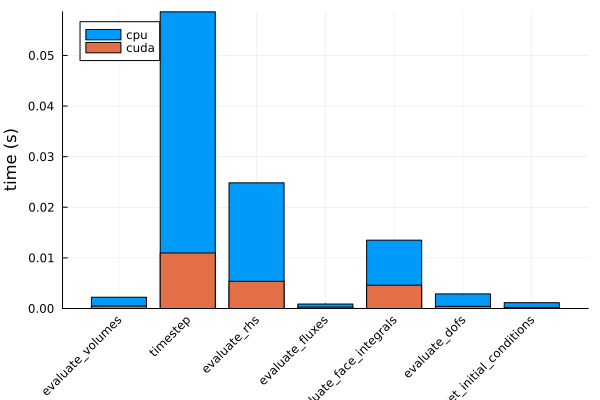

In [21]:
using YAML

using Plots

benchmark="results/eq=acoustic,scenario=gaussian_wave,device=cuda,size=300,nthreads=4.yaml"
data = YAML.load_file(benchmark)
function medians(d::Dict)
    return Dict(k => v["time"]["median"] for (k, v) in d)
end
medians(filename::String) = YAML.load_file(filename) |> medians
medians(data)
medians_acoustic_cuda = medians("results/eq=acoustic,scenario=gaussian_wave,device=cuda,size=300,nthreads=4.yaml")
medians_acoustic_cpu = medians("results/eq=acoustic,scenario=gaussian_wave,device=cpu,size=300,nthreads=4.yaml")
bar(medians_acoustic_cpu, label="cpu", legend=:topleft,xrotation = 45)
bar!(medians_acoustic_cuda, label="cuda", legend=:topleft)
ylabel!("time (s)")


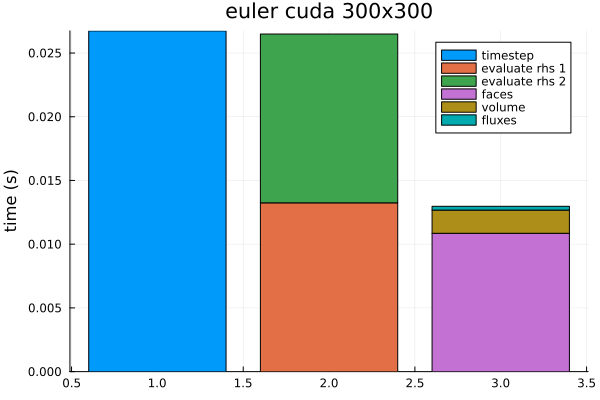

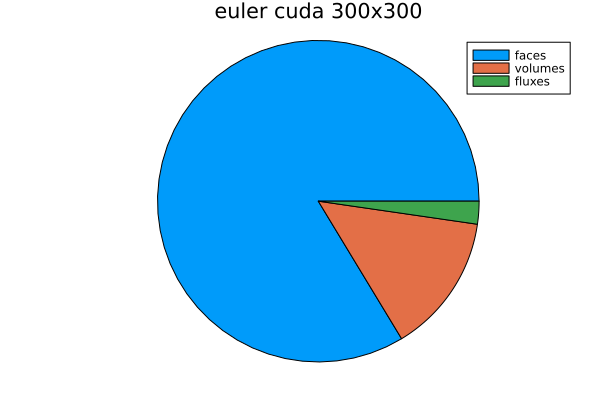

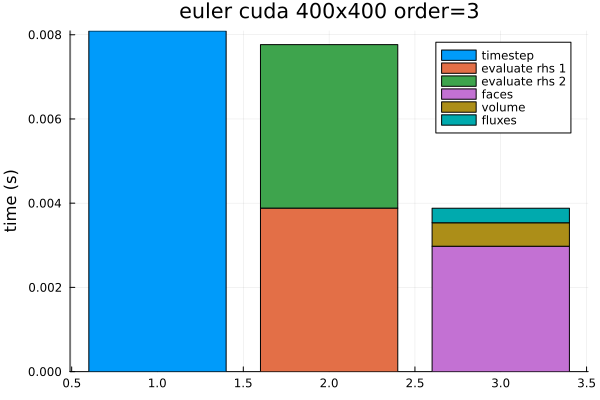

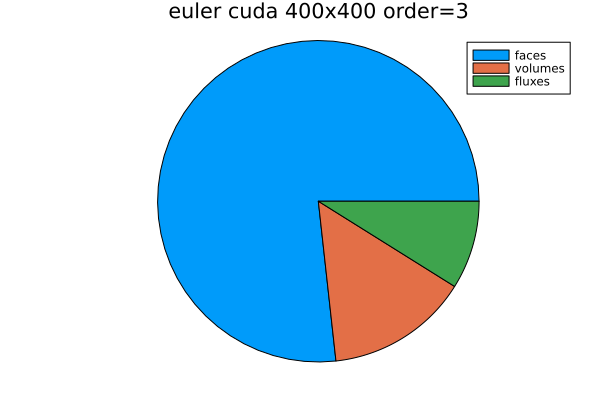

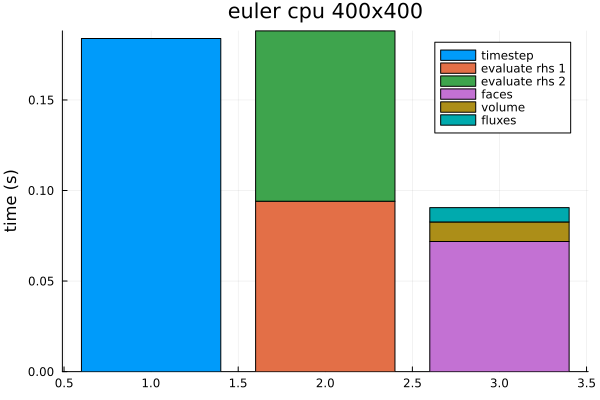

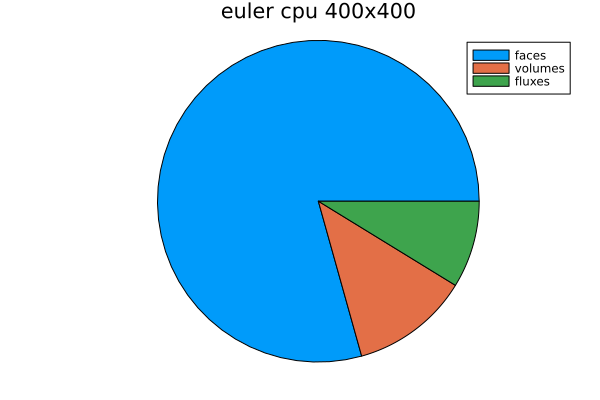

In [22]:
function plot_timestep(m::Dict, rhs_evals_per_step::Int, title::String="")

    p=bar([1], [m["timestep"]], label="timestep", legend=:topright)
    for i in 1:rhs_evals_per_step
        bar!(p,[2], [i*m["evaluate_rhs"]], label="evaluate rhs $i", fillto=(i-1)*m["evaluate_rhs"])
    end
    y=0
    bar!(p,[3], [m["evaluate_face_integrals"]+y], label="faces", fillto=[y])
    y+=m["evaluate_face_integrals"]
    bar!(p,[3], [m["evaluate_volumes"]+y], label="volume", fillto=[y])
    y+=m["evaluate_volumes"]
    bar!(p,[3], [m["evaluate_fluxes"]+y], label="fluxes", fillto=[y])
    y+=m["evaluate_fluxes"]
    ylabel!("time (s)")
    title!(title)
    display(p)
    pie(["faces", "volumes", "fluxes"], [m["evaluate_face_integrals"], m["evaluate_volumes"], m["evaluate_fluxes"]], title=title) |> display
end
plot_timestep(medians("results/eq=euler,scenario=sod-shock_tube,device=cuda,size=300,nthreads=4.yaml"),2,"euler cuda 300x300")
plot_timestep(medians("results/eq=euler,scenario=sod-shock_tube,device=cuda,size=400,nthreads=4,order=3.yaml"),2,"euler cuda 400x400 order=3")
plot_timestep(medians("results/eq=euler,scenario=sod-shock_tube,device=cpu,size=400,nthreads=4,order=3.yaml"), 2, "euler cpu 400x400")



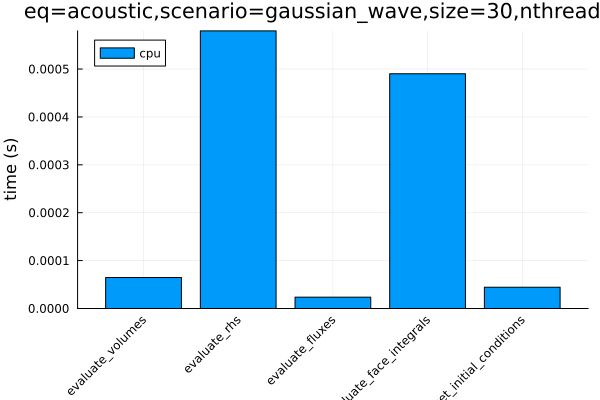

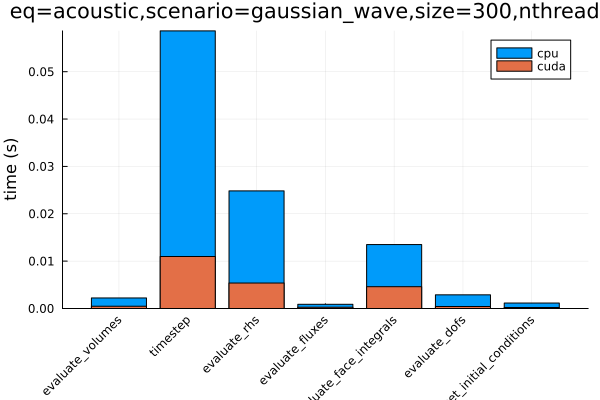

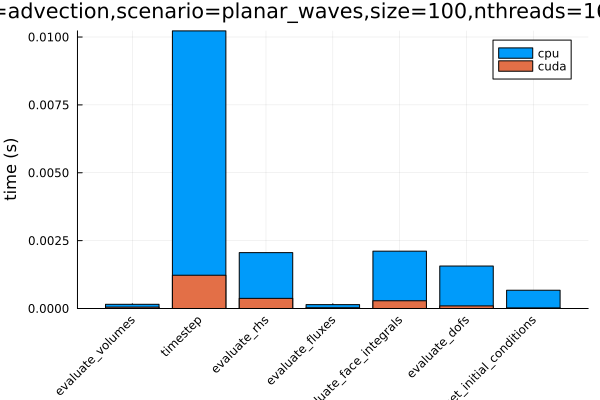

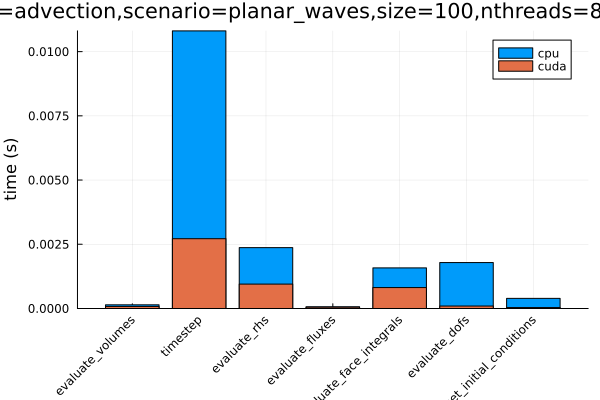

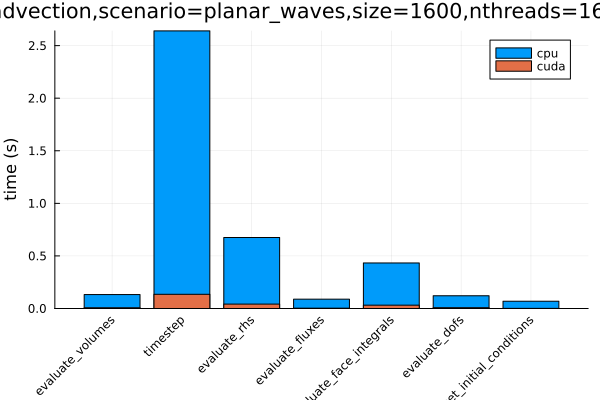

...

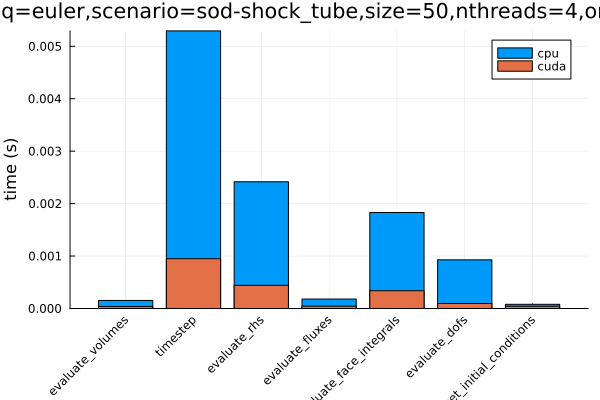

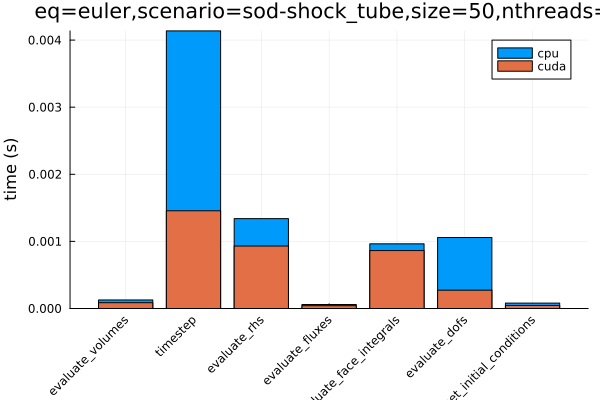

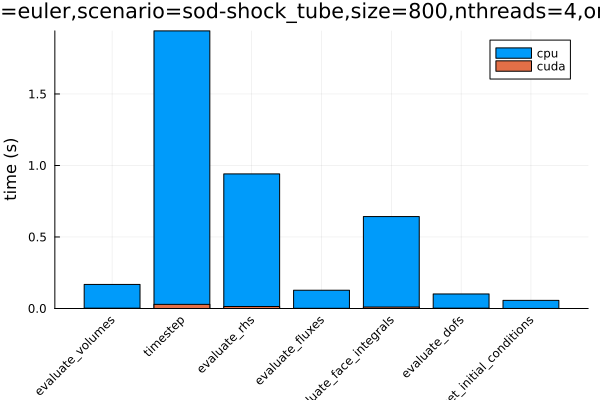

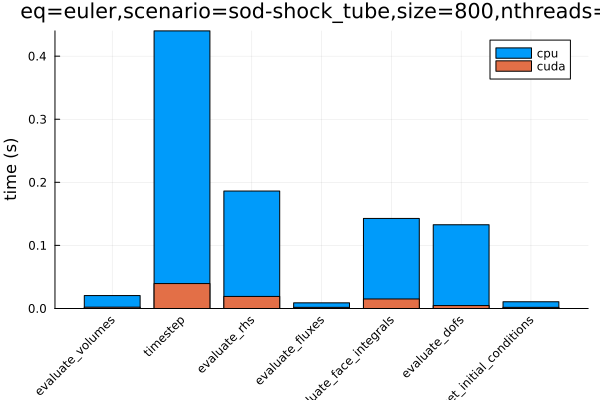

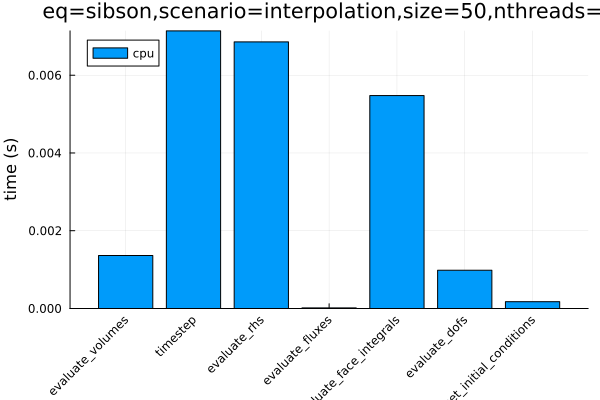

In [23]:
for config in readdir("results")
    if occursin("device=cpu", config)
        medians_cpu = medians("results/$config")
        p=bar(medians_cpu, label="cpu", legend=:topleft,xrotation = 45)
        cuda_name="results/$(replace(config, "device=cpu" => "device=cuda"))"
        if isfile(cuda_name)
            medians_cuda = medians(cuda_name)
            bar!(p,medians_cuda, label="cuda", legend=:topright)
        end
        ylabel!(p,"time (s)")
        title!(p,replace(config, "results/" => "", ".yaml" => "",",device=cpu" => "",",device=cuda" => ""))
        display(p)
    end
end

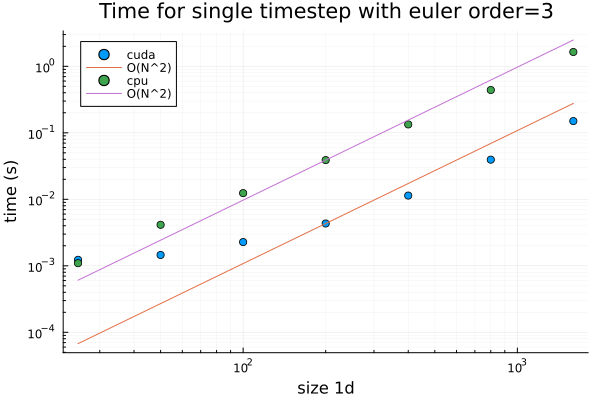

"/Users/ole/Documents/Studium/master/discrete_garlekin_seminar/terra-dg-group-1/benchmark/plots/scaling.png"

In [35]:
# plot scaling behavior

function get_times(filter::Regex,k="timestep")
    sizes = []
    median_times = []
    for config in readdir("results")
        m = match(filter, config)
        if m != nothing
            size = parse(Int, m.captures[1])
            if size==300
                continue
            end
            push!(sizes, size)
            times = medians("results/$config")
            push!(median_times, times[k])
        end
    end
    return sizes, median_times
end
sizes, median_times_cuda = get_times(r"eq=euler,scenario=sod-shock_tube,device=cuda,size=(\d+),nthreads=4.yaml")
using Plots
using Statistics
scatter(sizes, median_times_cuda, label="cuda", legend=:topleft, xaxis=:log, yaxis=:log,minorgrid=true)
median_time=median(median_times_cuda)
min_time=minimum(median_times_cuda)
median_size=median(sizes)
square_model(x) = (median_time)*(x/median_size)^2
plot!(sort(sizes), sort(square_model.(sizes)), label="O(N^2)", legend=:topleft)
ylabel!("time (s)")
xlabel!("size 1d")
sizes_cpu, median_times_cpu = get_times(r"eq=euler,scenario=sod-shock_tube,device=cpu,size=(\d+),nthreads=4.yaml")
scatter!(sizes_cpu, median_times_cpu, label="cpu", legend=:topleft)
title!("Time for single timestep with euler order=3")
median_time=median(median_times_cpu)
median_size=median(sizes)
square_model(x) = (median_time)*(x/median_size)^2
plot!(sort(sizes), sort(square_model.(sizes)), label="O(N^2)", legend=:topleft) |> display
savefig("plots/scaling.png")

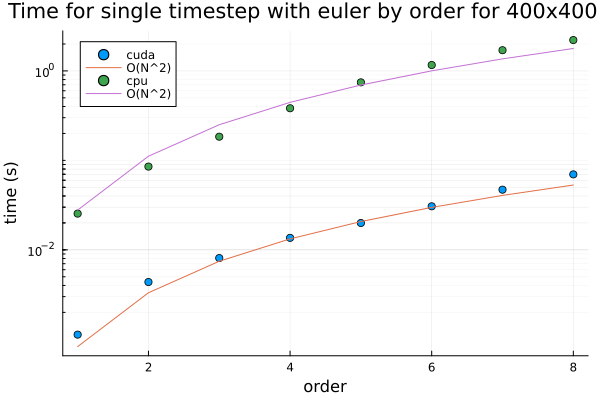

"/Users/ole/Documents/Studium/master/discrete_garlekin_seminar/terra-dg-group-1/benchmark/plots/order_scaling.png"

In [32]:
# plot scaling with different orders

# total time

orders, median_times = get_times(r"eq=euler,scenario=sod-shock_tube,device=cuda,size=400,nthreads=4,order=(\d+).yaml","timestep")
scatter(orders, median_times, label="cuda", legend=:topleft,yminorgrid=true, yscale=:log10)
title!("Time for single timestep with euler by order for 400x400 grid")
ylabel!("time (s)")
xlabel!("order")

median_order=median(orders)
median_time=median(median_times)
square_model(x) = (median_time)*(x/median_order)^2
plot!(sort(orders), sort(square_model.(orders)), label="O(N^2)", legend=:topleft)

orders, median_times = get_times(r"eq=euler,scenario=sod-shock_tube,device=cpu,size=400,nthreads=4,order=(\d+).yaml","timestep")
scatter!(orders, median_times, label="cpu", legend=:topleft)
median_order=median(orders)
median_time=median(median_times)
square_model(x) = (median_time)*(x/median_order)^2
plot!(sort(orders), sort(square_model.(orders)), label="O(N^2)", legend=:topleft) |> display
savefig("plots/order_scaling.png")

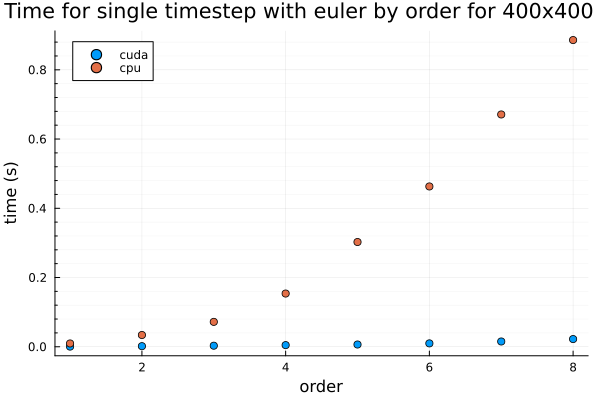

In [26]:
# face integrals

orders, median_times = get_times(r"eq=euler,scenario=sod-shock_tube,device=cuda,size=400,nthreads=4,order=(\d+).yaml","evaluate_face_integrals")
scatter(orders, median_times, label="cuda", legend=:topleft,yminorgrid=true)
title!("Time for single timestep with euler by order for 400x400 grid")
ylabel!("time (s)")
xlabel!("order")

orders, median_times = get_times(r"eq=euler,scenario=sod-shock_tube,device=cpu,size=400,nthreads=4,order=(\d+).yaml","evaluate_face_integrals")
scatter!(orders, median_times, label="cpu", legend=:topleft)

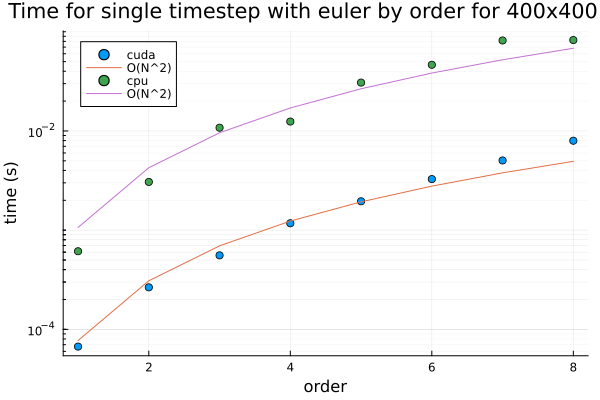

"/Users/ole/Documents/Studium/master/discrete_garlekin_seminar/terra-dg-group-1/benchmark/plots/order_scaling_volumes.png"

In [27]:
# volumes

orders, median_times = get_times(r"eq=euler,scenario=sod-shock_tube,device=cuda,size=400,nthreads=4,order=(\d+).yaml","evaluate_volumes")
scatter(orders, median_times, label="cuda", legend=:topleft,yminorgrid=true, yscale=:log10)
title!("Time for single timestep with euler by order for 400x400 grid")
ylabel!("time (s)")
xlabel!("order")

median_order=median(orders)
median_time=median(median_times)
square_model(x) = (median_time)*(x/median_order)^2
plot!(sort(orders), sort(square_model.(orders)), label="O(N^2)", legend=:topleft)

orders, median_times = get_times(r"eq=euler,scenario=sod-shock_tube,device=cpu,size=400,nthreads=4,order=(\d+).yaml","evaluate_volumes")
scatter!(orders, median_times, label="cpu", legend=:topleft)

median_order=median(orders)
median_time=median(median_times)
square_model(x) = (median_time)*(x/median_order)^2
plot!(sort(orders), sort(square_model.(orders)), label="O(N^2)", legend=:topleft) |> display
savefig("plots/order_scaling_volumes.png")

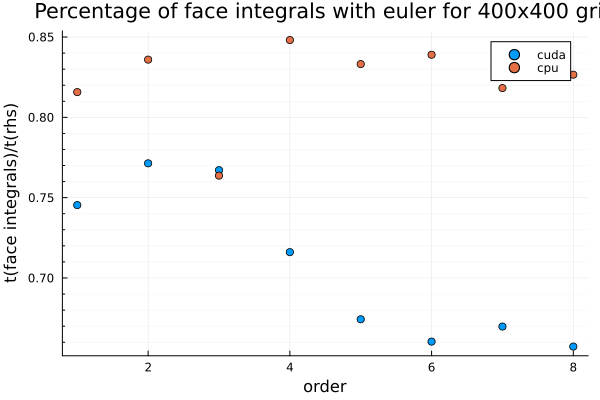

In [28]:
# percentage of face integrals for total time

orders, median_times_face = get_times(r"eq=euler,scenario=sod-shock_tube,device=cuda,size=400,nthreads=4,order=(\d+).yaml","evaluate_face_integrals")
orders, median_times_total = get_times(r"eq=euler,scenario=sod-shock_tube,device=cuda,size=400,nthreads=4,order=(\d+).yaml","evaluate_rhs")
scatter(orders, median_times_face./median_times_total, label="cuda", legend=:topright,yminorgrid=true)
title!("Percentage of face integrals with euler for 400x400 grid")
ylabel!("t(face integrals)/t(rhs)")
xlabel!("order")

orders, median_times_face = get_times(r"eq=euler,scenario=sod-shock_tube,device=cpu,size=400,nthreads=4,order=(\d+).yaml","evaluate_face_integrals")
orders, median_times_total = get_times(r"eq=euler,scenario=sod-shock_tube,device=cpu,size=400,nthreads=4,order=(\d+).yaml","evaluate_rhs")
scatter!(orders, median_times_face./median_times_total, label="cpu", legend=:topright)